In [1]:
import os
import json
import zlib
import base64
import numpy as np
from PIL import Image
from io import BytesIO
from torch.utils.data import Dataset
import torchvision.transforms as T


class CIHPDataset(Dataset):
    def __init__(self, root_dir, target_classes=None, transform=None, target_size=(512, 512)):
        self.img_dir = os.path.join(root_dir, 'img')
        self.ann_dir = os.path.join(root_dir, 'ann')
        self.filenames = sorted(f for f in os.listdir(self.img_dir) if f.endswith('.jpg'))
        self.target_classes = target_classes or ['face', 'head']
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image = Image.open(os.path.join(self.img_dir, filename)).convert('RGB')
        mask = self._load_mask_from_json(os.path.join(self.ann_dir, filename + '.json'), image.size)

        # Convert mask to np array
        mask = np.array(mask, dtype=np.int64)
        return image, mask


    def _load_mask_from_json(self, ann_path, image_size):
        width, height = image_size
        mask = Image.new('L', (width, height), 0)

        with open(ann_path, 'r') as f:
            data = json.load(f)

        for obj in data.get('objects', []):
            class_title = obj.get('classTitle', '').lower()
            if class_title not in self.target_classes:
                continue

            if obj.get('geometryType') != 'bitmap':
                continue

            bitmap = obj['bitmap']
            origin_x, origin_y = bitmap['origin']
            b64_data = bitmap['data']
            raw = zlib.decompress(base64.b64decode(b64_data))
            submask = Image.open(BytesIO(raw)).convert('L')

            # Paste submask into full image mask
            mask.paste(1, box=(origin_x, origin_y), mask=submask)

        return mask


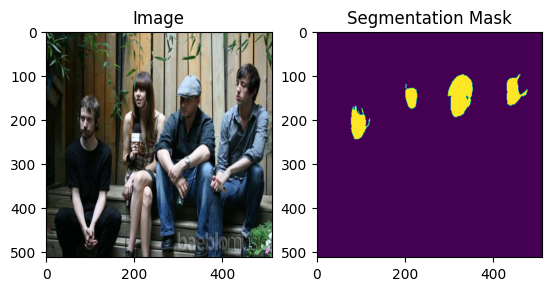

In [ ]:
dataset = CIHPDataset('C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training', target_classes=['face', 'hat', 'head'])
image, mask = dataset[1]

# Show it
import matplotlib.pyplot as plt
plt.subplot(1, 2, 1); plt.imshow(image.permute(1, 2, 0)); plt.title("Image")
plt.subplot(1, 2, 2); plt.imshow(mask); plt.title("Segmentation Mask")
plt.show()


In [8]:
import os
import json
import zlib
import base64
import numpy as np
from PIL import Image
from io import BytesIO
from torch.utils.data import Dataset
import torchvision.transforms as T
import torch
import torch.nn.functional as F


import os
import json
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision.transforms.functional as TF

import os, json, base64, zlib
import numpy as np
from PIL import Image
from io import BytesIO
from torch.utils.data import Dataset
import torchvision.transforms as T

class CIHPDataset(Dataset):
    def __init__(self, root_dir, target_classes=None, target_size=(512, 512)):
        self.img_dir = os.path.join(root_dir, 'img')
        self.ann_dir = os.path.join(root_dir, 'ann')
        self.filenames = sorted(f for f in os.listdir(self.img_dir) if f.endswith('.jpg'))
        self.target_classes = target_classes or ['face', 'head']
        self.target_size = target_size

        self.img_transform = T.Compose([
            T.Resize(target_size, interpolation=Image.BILINEAR),
            T.ToTensor()
        ])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]

        # Load image
        img_path = os.path.join(self.img_dir, filename)
        if not os.path.exists(img_path):
            raise FileNotFoundError(f"[CIHPDataset] Image file not found: {img_path}")
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            raise RuntimeError(f"[CIHPDataset] Failed to open image {img_path}: {e}")

        # Load mask from JSON
        ann_path = os.path.join(self.ann_dir, filename + '.json')
        if not os.path.exists(ann_path):
            raise FileNotFoundError(f"[CIHPDataset] Annotation file not found: {ann_path}")
        try:
            mask = self._load_mask_from_json(ann_path)
        except Exception as e:
            raise RuntimeError(f"[CIHPDataset] Failed to load JSON {ann_path}: {e}")

        # Resize and convert mask
        try:
            mask = mask.resize(self.target_size, resample=Image.NEAREST)
            mask = torch.from_numpy(np.array(mask, dtype=np.int64))
        except Exception as e:
            raise RuntimeError(f"[CIHPDataset] Failed to resize/convert mask: {e}")

        # Transform image
        try:
            image = self.img_transform(image)
        except Exception as e:
            raise RuntimeError(f"[CIHPDataset] Failed to transform image: {e}")

        return image, mask


    def _load_mask_from_json(self, ann_path):
        mask = Image.new('L', self._get_json_size(ann_path), 0)

        with open(ann_path, 'r') as f:
            data = json.load(f)

        for obj in data.get('objects', []):
            class_title = obj.get('classTitle', '').lower()
            if class_title not in self.target_classes:
                continue

            if obj.get('geometryType') != 'bitmap':
                continue

            bitmap = obj['bitmap']
            origin_x, origin_y = bitmap['origin']
            b64_data = bitmap['data']
            raw = zlib.decompress(base64.b64decode(b64_data))
            submask = Image.open(BytesIO(raw)).convert('L')
            mask.paste(1, box=(origin_x, origin_y), mask=submask)

        return mask

    def _get_json_size(self, ann_path):
        """Extract size from the first object or fallback to (512, 512)."""
        try:
            with open(ann_path, 'r') as f:
                data = json.load(f)
            w = data.get('size', {}).get('width', 512)
            h = data.get('size', {}).get('height', 512)
            return (w, h)
        except:
            return (512, 512)



import os
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision.transforms as T
import numpy as np

import os, json, base64, zlib
import numpy as np
from PIL import Image
from io import BytesIO
import torch
from torch.utils.data import Dataset
import torchvision.transforms as T

class CorruptedCIHPDataset(Dataset):
    def __init__(self, img_dir, ann_dir, target_classes=None, target_size=(512, 512)):
        self.img_dir = img_dir
        self.ann_dir = ann_dir
        self.filenames = sorted(f for f in os.listdir(self.img_dir) if f.endswith('.jpg'))
        self.target_classes = target_classes or ['face', 'head']
        self.target_size = target_size

        self.img_transform = T.Compose([
            T.Resize(target_size, interpolation=Image.BILINEAR),
            T.ToTensor()
        ])

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        print(f"[DEBUG] Loading: {filename}")

        try:
            image = Image.open(os.path.join(self.img_dir, filename)).convert('RGB')
        except Exception as e:
            raise RuntimeError(f"Failed to load image {filename}: {e}")

        ann_path = os.path.join(self.ann_dir, filename + '.json')
        try:
            mask = self._load_mask_from_json(ann_path)
        except Exception as e:
            raise RuntimeError(f"Failed to load JSON for {filename}: {e}")

        try:
            mask = mask.resize(self.target_size, resample=Image.NEAREST)
            mask = np.array(mask, dtype=np.int64)
            mask = torch.from_numpy(mask)
        except Exception as e:
            raise RuntimeError(f"Mask resize or conversion failed for {filename}: {e}")

        image = self.img_transform(image)
        return image, mask

    def _load_mask_from_json(self, ann_path):
        mask = Image.new('L', self._get_json_size(ann_path), 0)

        with open(ann_path, 'r') as f:
            data = json.load(f)

        for obj in data.get('objects', []):
            class_title = obj.get('classTitle', '').lower()
            if class_title not in self.target_classes:
                continue

            if obj.get('geometryType') != 'bitmap':
                continue

            bitmap = obj['bitmap']
            origin_x, origin_y = bitmap['origin']
            b64_data = bitmap['data']
            raw = zlib.decompress(base64.b64decode(b64_data))
            submask = Image.open(BytesIO(raw)).convert('L')
            mask.paste(1, box=(origin_x, origin_y), mask=submask)

        return mask

    def _get_json_size(self, ann_path):
        try:
            with open(ann_path, 'r') as f:
                data = json.load(f)
            w = data.get('size', {}).get('width', 512)
            h = data.get('size', {}).get('height', 512)
            return (w, h)
        except:
            return (512, 512)



from torch.utils.data import DataLoader, ConcatDataset

SOURCE_ROOT = "C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training"
OUTPUT_IMG_DIR = "C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training/corrupted"
OUTPUT_MASK_DIR = "C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training/corrupted_mask"
ANNOTATION_DIR = "C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training/ann"

dataset = ConcatDataset([
    CIHPDataset(root_dir=SOURCE_ROOT),
    CorruptedCIHPDataset(img_dir=OUTPUT_IMG_DIR, ann_dir=ANNOTATION_DIR)
])

train_loader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=0, pin_memory=True)


In [9]:
full_dataset = dataset

In [10]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, SubsetRandomSampler
import random
import numpy as np
from tqdm import tqdm
import time

from transformers import SegformerForSemanticSegmentation, SegformerConfig, SegformerImageProcessor
import torch.nn.functional as F

# --- Assumed Already Defined ---
# - full_dataset: your combined dataset (CIHP + CorruptedCIHP)
# - CIHPDataset and CorruptedCIHPDataset should be defined elsewhere

def train_segformer_model():
    # === Config ===
    TARGET_CLASSES = ['face', 'hat']
    NUM_CLASSES = len(TARGET_CLASSES) + 1  # +1 for background
    IMG_SIZE = (512, 512)
    BATCH_SIZE = 4
    NUM_EPOCHS = 20
    SUBSET_SIZE = 500
    DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"[INFO] Using device: {DEVICE}")

    # === Validate Dataset (Precheck 1 sample) ===
    try:
        test_image, test_mask = full_dataset[0]
        print(f"[CHECK] Dataset sample OK - image: {test_image.shape}, mask: {test_mask.shape}")
    except Exception as e:
        raise RuntimeError(f"[ERROR] Dataset test sample failed: {e}")

    # === Model Setup ===
    config = SegformerConfig(
        num_labels=NUM_CLASSES,
        id2label={i: name for i, name in enumerate(['background'] + TARGET_CLASSES)},
        label2id={name: i for i, name in enumerate(['background'] + TARGET_CLASSES)}
    )
    model = SegformerForSemanticSegmentation(config).to(DEVICE)
    processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=1e-4)

    # === Training Loop ===
    for epoch in range(NUM_EPOCHS):
        print(f"\n🔁 Epoch {epoch+1}/{NUM_EPOCHS}")
        indices = random.sample(range(len(full_dataset)), SUBSET_SIZE)
        sampler = SubsetRandomSampler(indices)

        # Set num_workers = 0 for stability on Windows
        train_loader = DataLoader(
            full_dataset,
            batch_size=BATCH_SIZE,
            sampler=sampler,
            num_workers=0,
            pin_memory=True
        )

        model.train()
        running_loss = 0.0
        start_time = time.time()

        for batch_idx, (pixel_values, labels) in enumerate(tqdm(train_loader, desc="Training")):
            pixel_values = pixel_values.to(DEVICE)
            labels = labels.to(DEVICE)

            try:
                outputs = model(pixel_values)
                _, _, H_out, W_out = outputs.logits.shape
                labels_resized = F.interpolate(
                    labels.unsqueeze(1).float(), size=(H_out, W_out), mode='nearest'
                ).squeeze(1).long()

                loss = criterion(outputs.logits, labels_resized)

                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
            except Exception as e:
                print(f"[ERROR] Batch {batch_idx} failed: {e}")
                continue

        elapsed = time.time() - start_time
        avg_loss = running_loss / len(train_loader)
        print(f"✅ Epoch {epoch+1} complete - Avg Loss: {avg_loss:.4f} - Time: {elapsed:.2f}s")

    # === Save Model ===
    save_path = "segformer_cihp_combined.pth"
    torch.save(model.state_dict(), save_path)
    print(f"✅ Training finished. Model saved to: {save_path}")


# === Call Training (for Notebook, no need for __main__) ===
train_segformer_model()


[INFO] Using device: cuda
[CHECK] Dataset sample OK - image: torch.Size([3, 512, 512]), mask: torch.Size([512, 512])

🔁 Epoch 1/20


Training: 100%|██████████| 125/125 [00:35<00:00,  3.54it/s]


✅ Epoch 1 complete - Avg Loss: 0.5827 - Time: 35.29s

🔁 Epoch 2/20


Training: 100%|██████████| 125/125 [00:35<00:00,  3.51it/s]


✅ Epoch 2 complete - Avg Loss: 0.2554 - Time: 35.63s

🔁 Epoch 3/20


Training: 100%|██████████| 125/125 [00:36<00:00,  3.45it/s]


✅ Epoch 3 complete - Avg Loss: 0.1827 - Time: 36.25s

🔁 Epoch 4/20


Training: 100%|██████████| 125/125 [00:38<00:00,  3.29it/s]


✅ Epoch 4 complete - Avg Loss: 0.1598 - Time: 38.02s

🔁 Epoch 5/20


Training: 100%|██████████| 125/125 [00:36<00:00,  3.39it/s]


✅ Epoch 5 complete - Avg Loss: 0.1486 - Time: 36.83s

🔁 Epoch 6/20


Training: 100%|██████████| 125/125 [00:34<00:00,  3.59it/s]


✅ Epoch 6 complete - Avg Loss: 0.1267 - Time: 34.79s

🔁 Epoch 7/20


Training: 100%|██████████| 125/125 [00:34<00:00,  3.59it/s]


✅ Epoch 7 complete - Avg Loss: 0.1383 - Time: 34.84s

🔁 Epoch 8/20


Training: 100%|██████████| 125/125 [00:33<00:00,  3.69it/s]


✅ Epoch 8 complete - Avg Loss: 0.1293 - Time: 33.86s

🔁 Epoch 9/20


Training: 100%|██████████| 125/125 [00:33<00:00,  3.71it/s]


✅ Epoch 9 complete - Avg Loss: 0.1295 - Time: 33.73s

🔁 Epoch 10/20


Training: 100%|██████████| 125/125 [00:33<00:00,  3.71it/s]


✅ Epoch 10 complete - Avg Loss: 0.1206 - Time: 33.65s

🔁 Epoch 11/20


Training: 100%|██████████| 125/125 [00:35<00:00,  3.54it/s]


✅ Epoch 11 complete - Avg Loss: 0.1235 - Time: 35.36s

🔁 Epoch 12/20


Training: 100%|██████████| 125/125 [00:32<00:00,  3.83it/s]


✅ Epoch 12 complete - Avg Loss: 0.1157 - Time: 32.63s

🔁 Epoch 13/20


Training: 100%|██████████| 125/125 [00:34<00:00,  3.67it/s]


✅ Epoch 13 complete - Avg Loss: 0.1117 - Time: 34.10s

🔁 Epoch 14/20


Training: 100%|██████████| 125/125 [00:32<00:00,  3.86it/s]


✅ Epoch 14 complete - Avg Loss: 0.1082 - Time: 32.40s

🔁 Epoch 15/20


Training: 100%|██████████| 125/125 [00:32<00:00,  3.89it/s]


✅ Epoch 15 complete - Avg Loss: 0.1179 - Time: 32.13s

🔁 Epoch 16/20


Training: 100%|██████████| 125/125 [00:32<00:00,  3.87it/s]


✅ Epoch 16 complete - Avg Loss: 0.1248 - Time: 32.28s

🔁 Epoch 17/20


Training: 100%|██████████| 125/125 [00:31<00:00,  3.93it/s]


✅ Epoch 17 complete - Avg Loss: 0.1077 - Time: 31.84s

🔁 Epoch 18/20


Training: 100%|██████████| 125/125 [00:31<00:00,  3.93it/s]


✅ Epoch 18 complete - Avg Loss: 0.1244 - Time: 31.81s

🔁 Epoch 19/20


Training: 100%|██████████| 125/125 [00:31<00:00,  3.99it/s]


✅ Epoch 19 complete - Avg Loss: 0.1024 - Time: 31.37s

🔁 Epoch 20/20


Training: 100%|██████████| 125/125 [00:31<00:00,  3.99it/s]

✅ Epoch 20 complete - Avg Loss: 0.1215 - Time: 31.36s
✅ Training finished. Model saved to: segformer_cihp_combined.pth


In [7]:
# cihp_training_pipeline.py
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import models
import torchvision.transforms as T
from tqdm import tqdm
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from PIL import Image
import numpy as np
from torch.optim.lr_scheduler import StepLR

# Decay LR by 0.1 every 10 epochs


# --- Config ---
ROOT_DIR = 'C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training'  # 'validation' or 'testing' for val/test
TARGET_CLASSES = ['face', 'hat']  # define classes you care about
NUM_CLASSES = len(TARGET_CLASSES) + 1  # +1 for background
BATCH_SIZE = 4
NUM_EPOCHS = 20
IMG_SIZE = (512, 512)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from torch.utils.data import Subset
import random


# --- Dataset ---
train_dataset = CIHPDataset(
    root_dir=ROOT_DIR,
    target_classes=TARGET_CLASSES,
    target_size=IMG_SIZE
)
subset_size = 500
indices = random.sample(range(len(train_dataset)), subset_size)
train_subset = Subset(train_dataset, indices)

train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, collate_fn=lambda x: x)


# --- Hugging Face Setup ---
MODEL_NAME = "nvidia/segformer-b0-finetuned-ade-512-512"
image_processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2},
    ignore_mismatched_sizes=True  # <-- allow replacing the final layer
)


model = model.to(DEVICE)


# --- Loss + Optimizer ---
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = StepLR(optimizer, step_size=10, gamma=0.1)

# --- Training Loop ---
for epoch in range(NUM_EPOCHS):
    model.train()
    running_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}"):
        images, masks = zip(*batch)  # unzip the list of (image, mask) tuples


        pixel_values = []
        labels = []

        for img, mask in zip(images, masks):
            processed = image_processor(images=img, segmentation_maps=mask, return_tensors="pt")
            pixel_values.append(processed["pixel_values"])
            labels.append(processed["labels"])

        pixel_values = torch.cat(pixel_values).to(DEVICE)
        labels = torch.cat(labels).to(DEVICE)

        optimizer.zero_grad()
        outputs = model(pixel_values, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
    scheduler.step()
    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}")


# --- Save Model ---
torch.save(model.state_dict(), 'segformer_cihp.pth')
print("Training complete. Model saved.")


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([3]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([3, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Epoch 1/20: 100%|██████████| 125/125 [00:41<00:00,  3.02it/s]


Epoch 1, Loss: 0.4919


Epoch 2/20: 100%|██████████| 125/125 [00:33<00:00,  3.70it/s]


Epoch 2, Loss: 0.1560


Epoch 3/20: 100%|██████████| 125/125 [00:31<00:00,  3.97it/s]


Epoch 3, Loss: 0.0973


Epoch 4/20: 100%|██████████| 125/125 [00:33<00:00,  3.73it/s]


Epoch 4, Loss: 0.0701


Epoch 5/20: 100%|██████████| 125/125 [00:33<00:00,  3.77it/s]


Epoch 5, Loss: 0.0566


Epoch 6/20: 100%|██████████| 125/125 [00:39<00:00,  3.19it/s]


Epoch 6, Loss: 0.0494


Epoch 7/20: 100%|██████████| 125/125 [00:38<00:00,  3.28it/s]


Epoch 7, Loss: 0.0436


Epoch 8/20: 100%|██████████| 125/125 [00:31<00:00,  3.91it/s]


Epoch 8, Loss: 0.0407


Epoch 9/20: 100%|██████████| 125/125 [00:30<00:00,  4.15it/s]


Epoch 9, Loss: 0.0367


Epoch 10/20: 100%|██████████| 125/125 [00:29<00:00,  4.21it/s]


Epoch 10, Loss: 0.0383


Epoch 11/20: 100%|██████████| 125/125 [00:30<00:00,  4.16it/s]


Epoch 11, Loss: 0.0387


Epoch 12/20: 100%|██████████| 125/125 [00:29<00:00,  4.25it/s]


Epoch 12, Loss: 0.0327


Epoch 13/20: 100%|██████████| 125/125 [00:29<00:00,  4.20it/s]


Epoch 13, Loss: 0.0311


Epoch 14/20: 100%|██████████| 125/125 [00:30<00:00,  4.17it/s]


Epoch 14, Loss: 0.0304


Epoch 15/20: 100%|██████████| 125/125 [00:26<00:00,  4.66it/s]


Epoch 15, Loss: 0.0306


Epoch 16/20: 100%|██████████| 125/125 [00:28<00:00,  4.46it/s]


Epoch 16, Loss: 0.0290


Epoch 17/20: 100%|██████████| 125/125 [00:28<00:00,  4.42it/s]


Epoch 17, Loss: 0.0286


Epoch 18/20: 100%|██████████| 125/125 [00:29<00:00,  4.30it/s]


Epoch 18, Loss: 0.0280


Epoch 19/20: 100%|██████████| 125/125 [00:29<00:00,  4.26it/s]


Epoch 19, Loss: 0.0278


Epoch 20/20: 100%|██████████| 125/125 [00:28<00:00,  4.34it/s]

Epoch 20, Loss: 0.0270
Training complete. Model saved.


In [ ]:
# cihp_training_pipeline.py
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, SubsetRandomSampler
from torchvision import models
import torchvision.transforms as T
from tqdm import tqdm
import random

# --- Config ---
ROOT_DIR = 'C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training'
TARGET_CLASSES = ['face', 'hat']
NUM_CLASSES = len(TARGET_CLASSES) + 1
BATCH_SIZE = 4
NUM_EPOCHS = 20
IMG_SIZE = (512, 512)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Dataset ---
train_dataset = CIHPDataset(
    root_dir=ROOT_DIR,
    target_classes=TARGET_CLASSES,
    target_size=IMG_SIZE
)

# --- Model ---
model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model = model.to(DEVICE)

# --- Loss + Optimizer ---
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

# --- Training Loop ---
for epoch in range(NUM_EPOCHS):
    # Create a new random subset of 125 unique samples each epoch
    subset_size = 500
    indices = random.sample(range(len(train_dataset)), subset_size)
    sampler = SubsetRandomSampler(indices)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=0)

    model.train()
    running_loss = 0.0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}"):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}")

# --- Save Model ---
torch.save(model.state_dict(), 'deeplabv3_cihp_2.pth')
print("Training complete. Model saved.")

In [14]:
import cv2
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torchvision import models
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
import random

def evaluate_instance_recovery(model, dataloader, processor, face_class=1):
    model.eval()
    total_gt_faces = 0
    total_pred_faces = 0

    with torch.no_grad():
        for batch in dataloader:
            images, masks = zip(*batch)

            for img, mask in zip(images, masks):
                processed = processor(images=img, segmentation_maps=mask, return_tensors="pt")
                pixel_values = processed["pixel_values"].to(DEVICE)
                true_mask = np.array(mask)

                outputs = model(pixel_values)
                # Try DeepLabV3 key first, fallback to .logits
                if hasattr(outputs, 'logits'):
                    logits = outputs.logits  # SegFormer
                else:
                    logits = outputs['out']  # DeepLabV3


                pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()

                gt_instances = cv2.connectedComponents((true_mask == face_class).astype(np.uint8))[0] - 1
                pred_instances = cv2.connectedComponents((pred_mask == face_class).astype(np.uint8))[0] - 1

                total_gt_faces += gt_instances
                total_pred_faces += pred_instances

    return total_pred_faces, total_gt_faces



deeplab = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
deeplab.classifier[4] = nn.Conv2d(256, 3, kernel_size=1)  # 3 = background, face, hat
deeplab.load_state_dict(torch.load("deeplabv3_cihp_2.pth", map_location=DEVICE))
deeplab = deeplab.to(DEVICE)



from transformers import SegformerForSemanticSegmentation, SegformerConfig

# Rebuild config manually
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)


image_processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

dataset = CIHPDataset('C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training', target_classes=['face', 'hat', 'head'])
subset = Subset(dataset, random.sample(range(len(dataset)), 100))

val_loader = DataLoader(subset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)

pred_deeplab, gt_deeplab = evaluate_instance_recovery(deeplab, val_loader, image_processor, face_class=1)
pred_segformer, gt_segformer = evaluate_instance_recovery(segformer, val_loader, image_processor, face_class=1)

print(f"DeepLabV3+: Predicted {pred_deeplab} vs GT {gt_deeplab}")
print(f"SegFormer  : Predicted {pred_segformer} vs GT {gt_segformer}")



C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\2407059050.py:44: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  deeplab.load_state_dict(torch.load("deeplabv3_cihp_2.pth", 

DeepLabV3+: Predicted 54 vs GT 315
SegFormer  : Predicted 293 vs GT 315


C:\Users\alexi\AppData\Local\Temp\ipykernel_23236\659435528.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE))

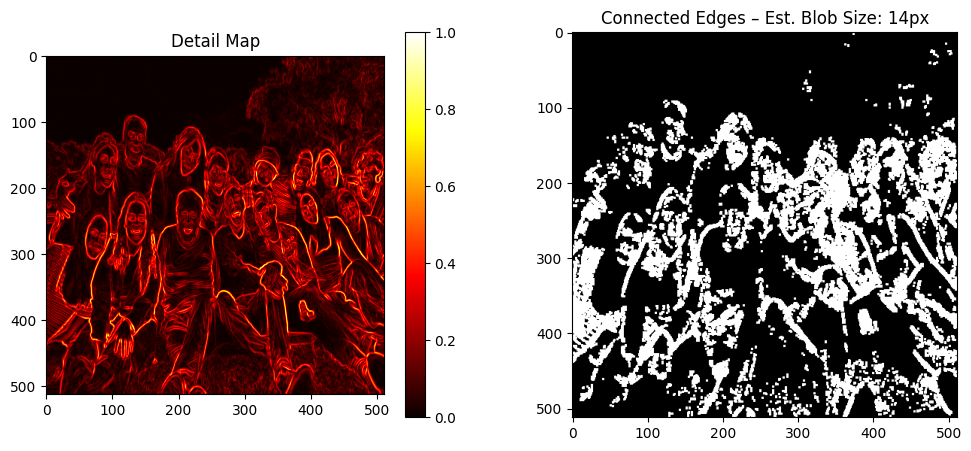

Saved: results\istockphoto-1480574526-612x612_comparison.png


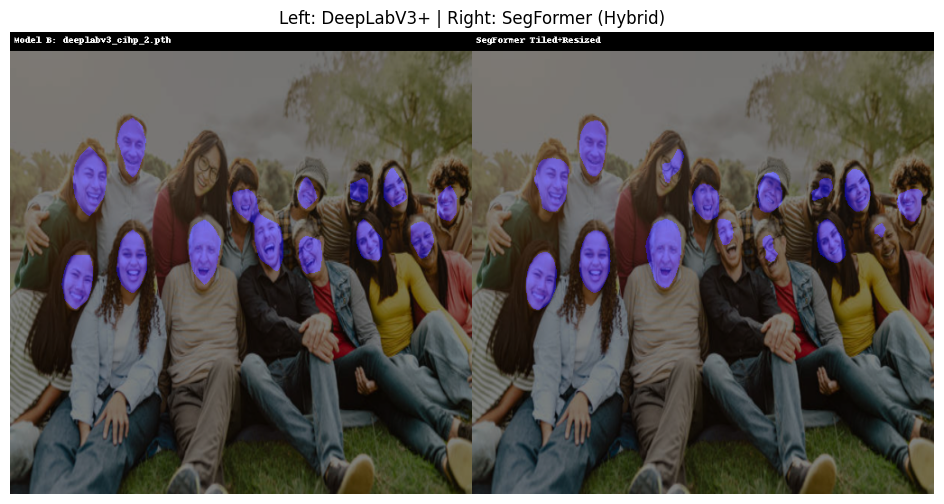

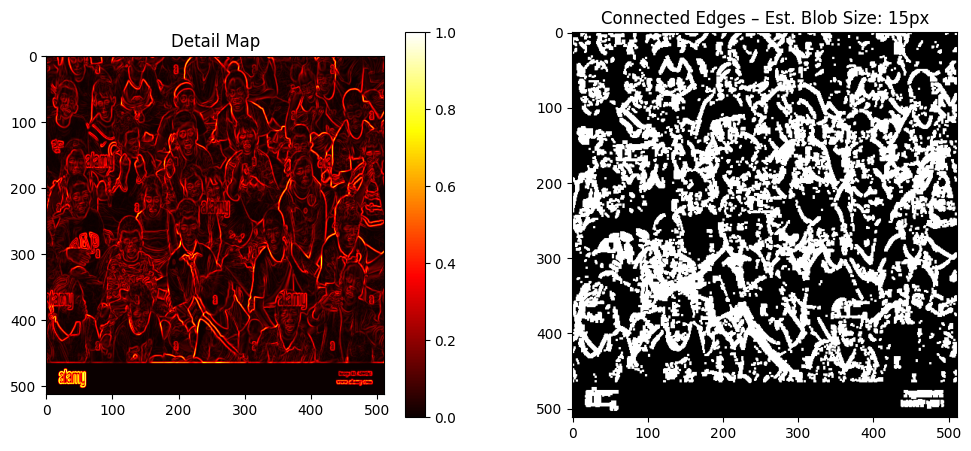

Saved: results\crowd-of-primary-school-children-in-the-school-playground-A6WGT8_comparison.png


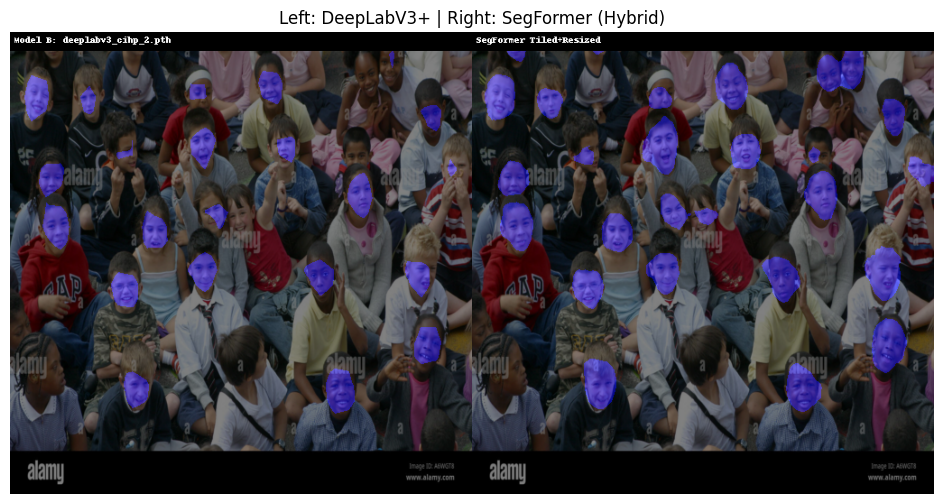

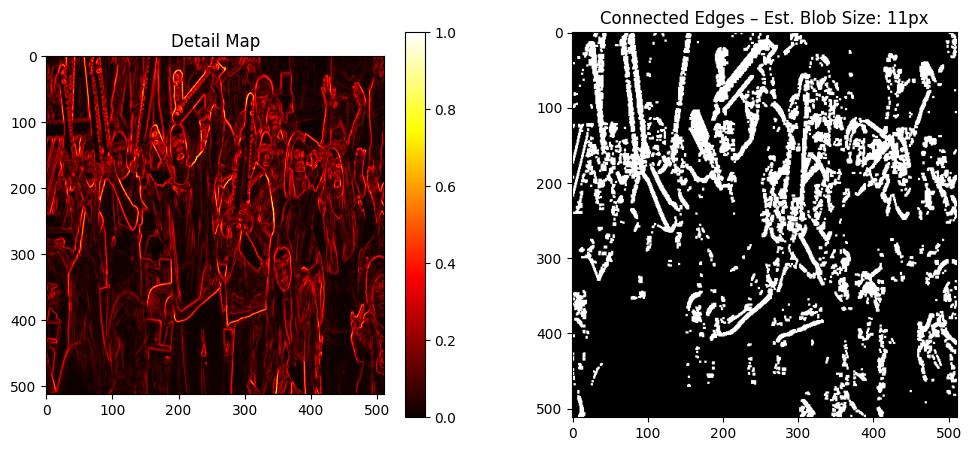

Saved: results\convert_comparison.png


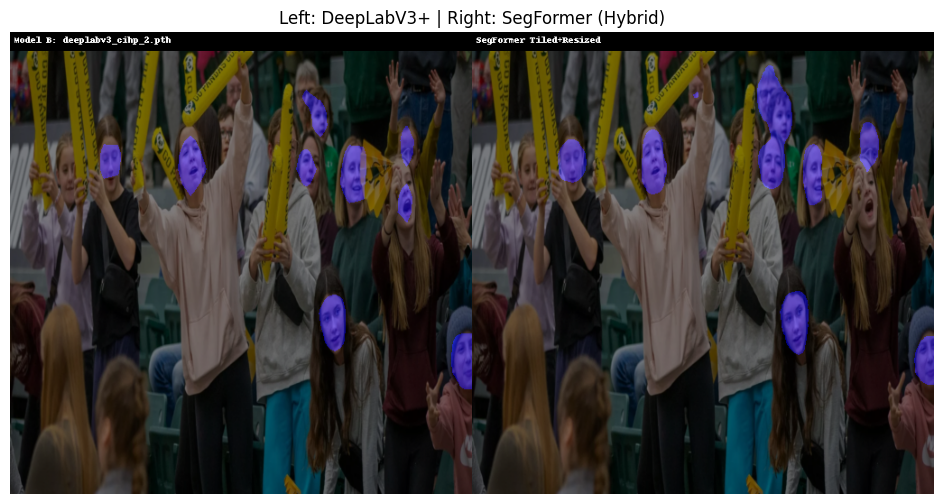

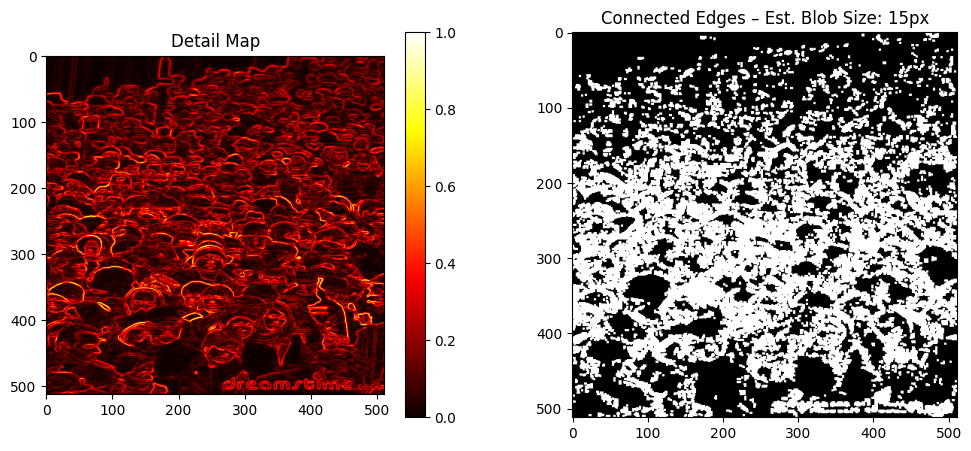

Saved: results\cd097ca3e6a09fa9d231f10b549d14b9_comparison.png


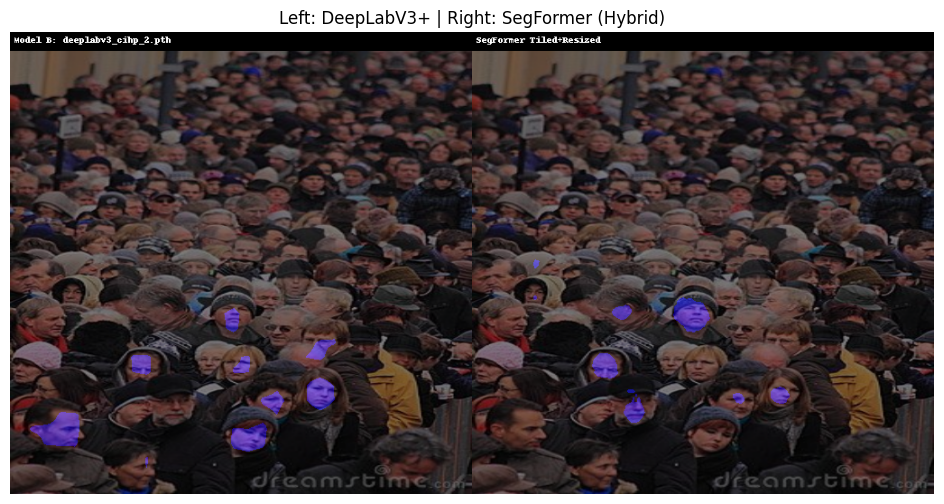

In [17]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, IMG_SIZE, np.array(image_resized)  # return resized image for overlay


# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Load SegFormer ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)

# --- Predict with SegFormer ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (width, height)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits  # shape: [1, C, H, W]
    
    # Resize prediction back to original resolution
    upsampled_logits = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred_mask

# --- Predict with SegFormer + Tiling ---
def predict_mask_segformer_with_tiles(model, processor, image_pil, tile_size=(512, 512), stride=256, class_id=1):
    w, h = image_pil.size
    full_mask = np.zeros((h, w), dtype=np.uint8)

    # Full resized prediction
    full_inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        full_logits = model(**full_inputs).logits
    full_logits_upsampled = F.interpolate(full_logits, size=(h, w), mode="bilinear", align_corners=False)
    full_pred = torch.argmax(full_logits_upsampled, dim=1).squeeze(0).cpu().numpy()

    # Sliding window prediction
    image_np = np.array(image_pil)
    tile_mask = np.zeros((h, w), dtype=np.uint8)

    for y in range(0, h - tile_size[1] + 1, stride):
        for x in range(0, w - tile_size[0] + 1, stride):
            crop = image_pil.crop((x, y, x + tile_size[0], y + tile_size[1]))
            inputs = processor(images=crop, return_tensors="pt").to(DEVICE)

            with torch.no_grad():
                outputs = model(**inputs).logits

            # Upsample tile logits to tile size
            upsampled_logits = F.interpolate(outputs, size=tile_size, mode="bilinear", align_corners=False)
            pred = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()

            tile_mask[y:y + tile_size[1], x:x + tile_size[0]] = np.maximum(tile_mask[y:y + tile_size[1], x:x + tile_size[0]], pred)

    # Union of tiled + full resized mask
    union_mask = np.where((full_pred == class_id) | (tile_mask == class_id), class_id, 0).astype(np.uint8)
    return union_mask


def preprocess_resized_image(img_path):
    image = Image.open(img_path).convert("RGB")
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    return image_resized, np.array(image_resized)

def predict_mask_segformer_with_tiles(
    model,
    processor,
    image_pil,
    tile_size=(512, 512),
    stride=256,
    detail_stride=128,
    detail_threshold=0.3,
    class_id=1
):
    w, h = image_pil.size
    image_np = np.array(image_pil)

    # === 1. Estimate Blob Size from Edge Map ===
    def estimate_average_blob_size(image_np):
        gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
        edges = np.uint8(np.abs(sobel) > 30)
        kernel = np.ones((3, 3), np.uint8)
        dilated = cv2.dilate(edges, kernel, iterations=1)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(dilated)
        areas = stats[1:, cv2.CC_STAT_AREA]
        if len(areas) == 0:
            return 64
        avg_area = np.mean(areas)
        est_size = int(np.sqrt(avg_area))
        return est_size, dilated

    blob_size, dilated = estimate_average_blob_size(image_np)
    detail_tile_size = max(64, min(512, 4 * blob_size))

    # === 2. Full Image Segmentation ===
    full_inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        full_logits = model(**full_inputs).logits
    full_pred = torch.argmax(
        F.interpolate(full_logits, size=(h, w), mode="bilinear", align_corners=False),
        dim=1
    ).squeeze(0).cpu().numpy()

    # === 3. Sliding Window Segmentation ===
    tile_mask = np.zeros((h, w), dtype=np.uint8)
    for y in range(0, h - tile_size[1] + 1, stride):
        for x in range(0, w - tile_size[0] + 1, stride):
            crop = image_pil.crop((x, y, x + tile_size[0], y + tile_size[1]))
            inputs = processor(images=crop, return_tensors="pt").to(DEVICE)
            with torch.no_grad():
                outputs = model(**inputs).logits
            pred = torch.argmax(
                F.interpolate(outputs, size=tile_size, mode="bilinear", align_corners=False),
                dim=1
            ).squeeze(0).cpu().numpy()
            tile_mask[y:y + tile_size[1], x:x + tile_size[0]] = np.maximum(
                tile_mask[y:y + tile_size[1], x:x + tile_size[0]],
                pred
            )

    # === 4. Compute Detail Map ===
    def compute_detail_map(image_np):
        gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        grad_mag = np.sqrt(sobelx ** 2 + sobely ** 2)
        return grad_mag / grad_mag.max()

    detail_map = compute_detail_map(image_np)

    # === 5. Select High-Detail Tiles ===
    def get_high_detail_tiles(detail_map):
        tiles = []
        for y in range(0, h - detail_tile_size + 1, detail_stride):
            for x in range(0, w - detail_tile_size + 1, detail_stride):
                tile = detail_map[y:y + detail_tile_size, x:x + detail_tile_size]
                if tile.mean() > detail_threshold:
                    tiles.append((x, y, detail_tile_size, detail_tile_size))
        return tiles

    high_detail_tiles = get_high_detail_tiles(detail_map)

    # === 6. Adaptive Mask Pass ===
    adaptive_mask = np.zeros((h, w), dtype=np.uint8)
    for x, y, tw, th in high_detail_tiles:
        crop = image_pil.crop((x, y, x + tw, y + th)).resize((512, 512), Image.BILINEAR)
        inputs = processor(images=crop, return_tensors="pt").to(DEVICE)
        with torch.no_grad():
            outputs = model(**inputs).logits
        pred = torch.argmax(outputs, dim=1).squeeze(0).cpu().numpy()
        pred_resized = cv2.resize(pred.astype(np.uint8), (tw, th), interpolation=cv2.INTER_NEAREST)
        adaptive_mask[y:y + th, x:x + tw] = np.maximum(adaptive_mask[y:y + th, x:y + th], pred_resized)

    # === 7. Merge Masks ===
    final_mask = np.where(
        (full_pred == class_id) | (tile_mask == class_id) | (adaptive_mask == class_id),
        class_id,
        0
    ).astype(np.uint8)

    # === 8. Optional Debug Plots ===
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(detail_map, cmap='hot')
    plt.title("Detail Map")
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.imshow(dilated, cmap='gray')
    plt.title(f"Connected Edges – Est. Blob Size: {blob_size}px")
    plt.show()

    return final_mask


# --- Combined display ---
def show_both_models_output(img_path, output_dir="results"):
    import os
    os.makedirs(output_dir, exist_ok=True)
    filename = os.path.splitext(os.path.basename(img_path))[0]

    tensor, original_size, orig_image = preprocess_image(img_path)
    image_pil, orig_image = preprocess_resized_image(img_path)

    # --- DeepLab ---
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    # --- SegFormer (tiled + resized union) ---
    mask_S = predict_mask_segformer_with_tiles(segformer, processor, image_pil)
    overlay_S = overlay_mask(orig_image, mask_S)
    overlay_S = draw_caption(overlay_S, "SegFormer Tiled+Resized")

    # Combine and display
    combined = np.hstack((overlay_B, overlay_S))

    # Save image
    save_path = os.path.join(output_dir, f"{filename}_comparison.png")
    Image.fromarray(combined).save(save_path)
    print(f"Saved: {save_path}")

    # Optionally still display
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: DeepLabV3+ | Right: SegFormer (Hybrid)")
    plt.show()


# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_both_models_output(path)



C:\Users\alexi\AppData\Local\Temp\ipykernel_3636\1035346424.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE))

Saved: results/istockphoto-1480574526-612x612_segformer_comparison.png


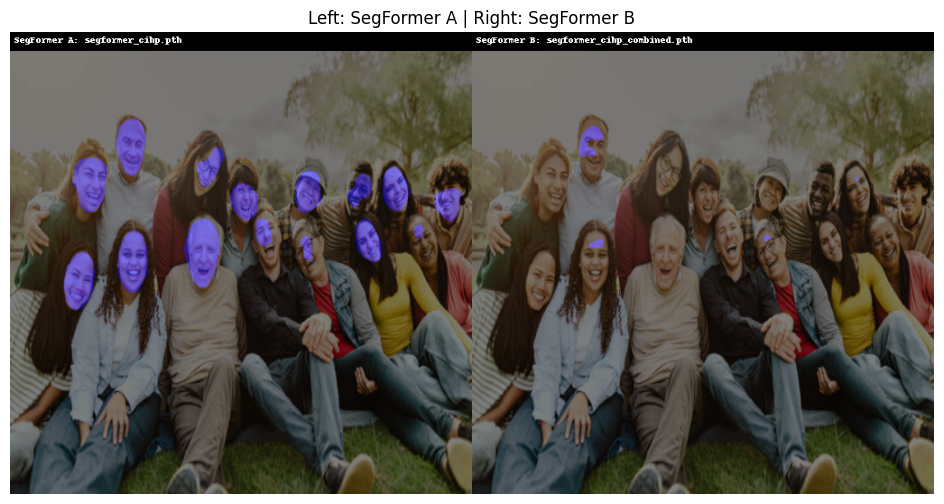

Saved: results/crowd-of-primary-school-children-in-the-school-playground-A6WGT8_segformer_comparison.png


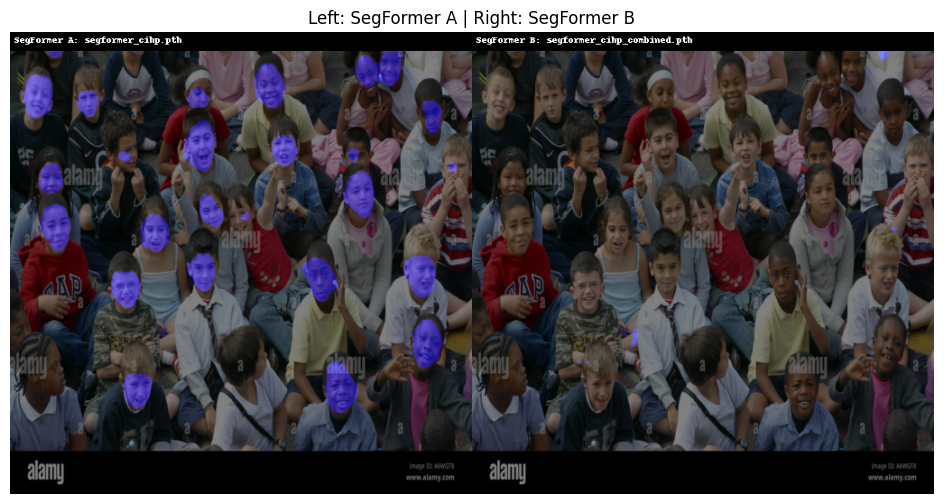

Saved: results/convert_segformer_comparison.png


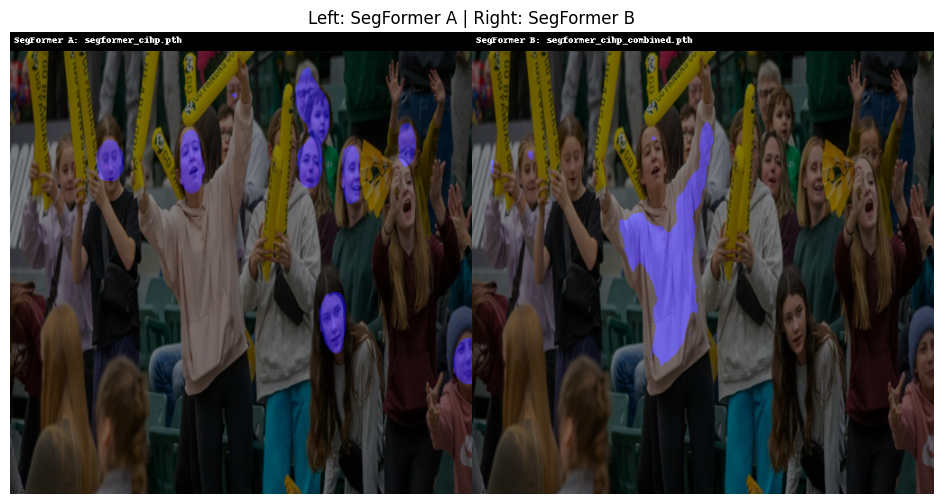

Saved: results/cd097ca3e6a09fa9d231f10b549d14b9_segformer_comparison.png


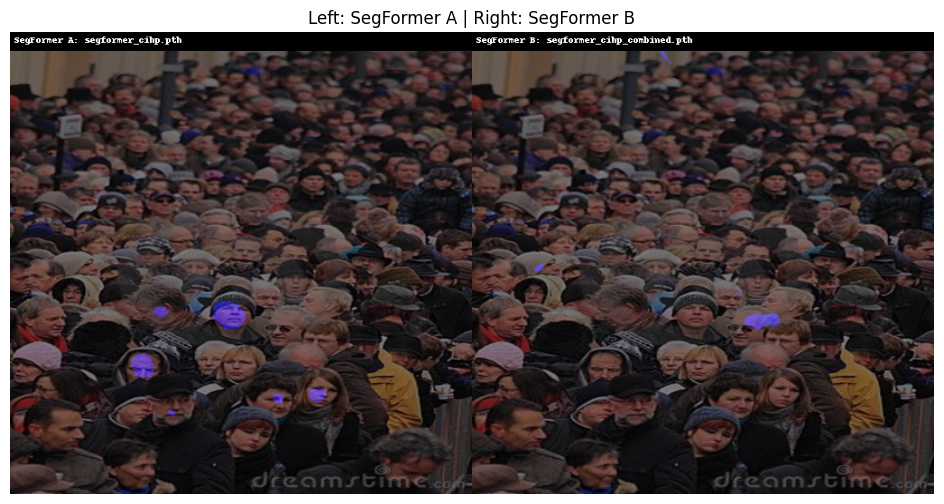

In [9]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor, SegformerConfig
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F
import os

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5
os.makedirs("results", exist_ok=True)

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, IMG_SIZE, np.array(image_resized)

def preprocess_resized_image(img_path):
    image = Image.open(img_path).convert("RGB")
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    return image_resized, np.array(image_resized)

# --- Overlay + Caption ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    return cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)

def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Load SegFormer model ---
def load_segformer(path):
    config = SegformerConfig(
        num_labels=NUM_CLASSES,
        id2label={0: "background", 1: "face", 2: "hat"},
        label2id={"background": 0, "face": 1, "hat": 2}
    )
    model = SegformerForSemanticSegmentation(config)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model = model.to(DEVICE).eval()
    return model

processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
segformer_A = load_segformer("segformer_cihp.pth")
segformer_B = load_segformer("segformer_cihp_combined.pth")

# --- SegFormer Inference ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (W, H)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        logits = model(**inputs).logits
    upsampled = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    return torch.argmax(upsampled, dim=1).squeeze(0).cpu().numpy()

# --- Show + Save ---
def compare_segformers(img_path):
    filename = os.path.splitext(os.path.basename(img_path))[0]
    image_pil, orig_image = preprocess_resized_image(img_path)

    mask_A = predict_mask_segformer(segformer_A, processor, image_pil)
    overlay_A = overlay_mask(orig_image, mask_A)
    overlay_A = draw_caption(overlay_A, "SegFormer A: segformer_cihp.pth")

    mask_B = predict_mask_segformer(segformer_B, processor, image_pil)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "SegFormer B: segformer_cihp_combined.pth")

    combined = np.hstack((overlay_A, overlay_B))
    save_path = f"results/{filename}_segformer_comparison.png"
    Image.fromarray(combined).save(save_path)
    print(f"Saved: {save_path}")

    # Optional: show
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: SegFormer A | Right: SegFormer B")
    plt.show()

# --- Run on images ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    compare_segformers(path)


C:\Users\alexi\AppData\Local\Temp\ipykernel_23236\1530915237.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE)

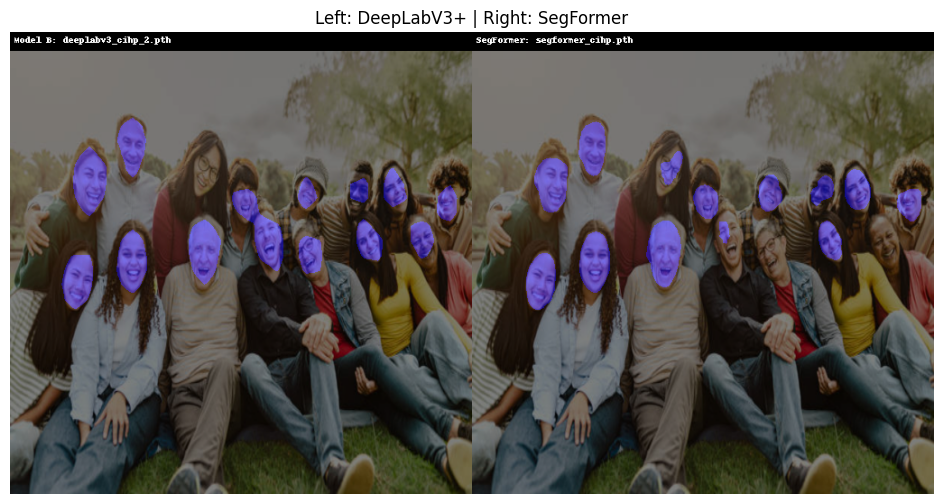

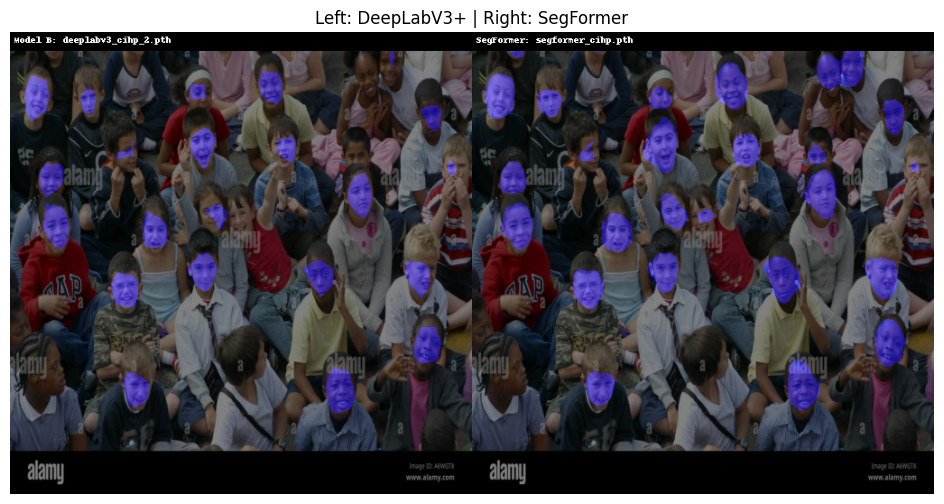

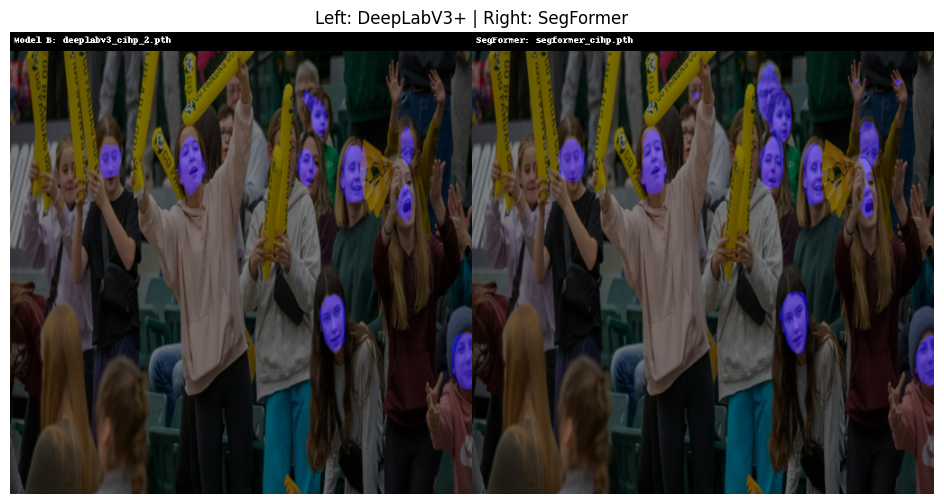

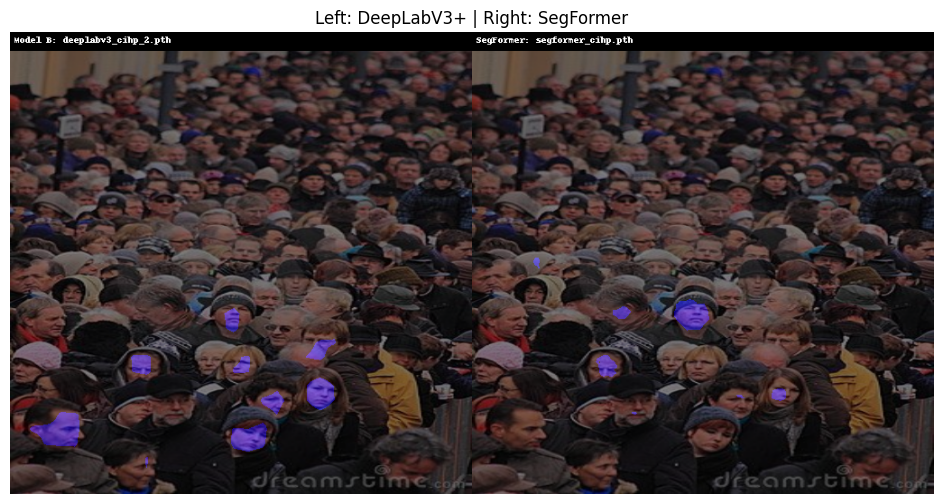

In [16]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, IMG_SIZE, np.array(image_resized)  # return resized image for overlay


# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Load SegFormer ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)

# --- Predict with SegFormer ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (width, height)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits  # shape: [1, C, H, W]
    
    # Resize prediction back to original resolution
    upsampled_logits = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred_mask

def preprocess_resized_image(img_path):
    image = Image.open(img_path).convert("RGB")
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    return image_resized, np.array(image_resized)



# --- Combined display ---
def show_both_models_output(img_path):
    # Original image + preprocessed version
    tensor, original_size, orig_image = preprocess_image(img_path)
    image_pil, orig_image = preprocess_resized_image(img_path)


    # --- Model B (DeepLabV3+) ---
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    # --- SegFormer ---
    mask_S = predict_mask_segformer(segformer, processor, image_pil)
    overlay_S = overlay_mask(orig_image, mask_S)
    overlay_S = draw_caption(overlay_S, "SegFormer: segformer_cihp.pth")

    # --- Combine and show ---
    combined = np.hstack((overlay_B, overlay_S))
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: DeepLabV3+ | Right: SegFormer")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_both_models_output(path)


C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\3129014326.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE)

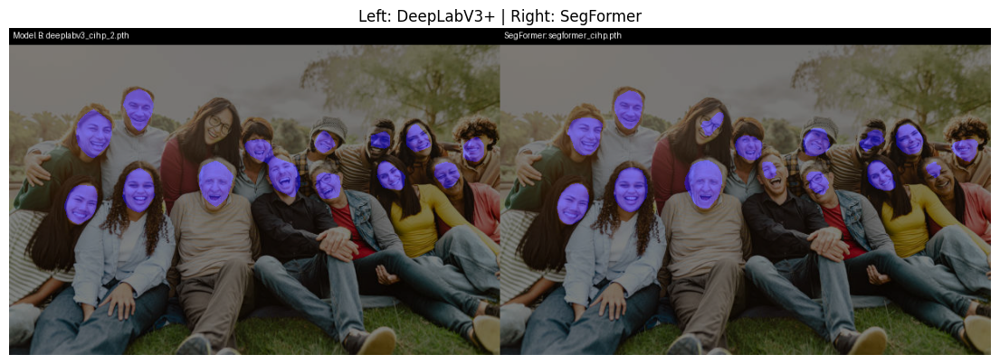

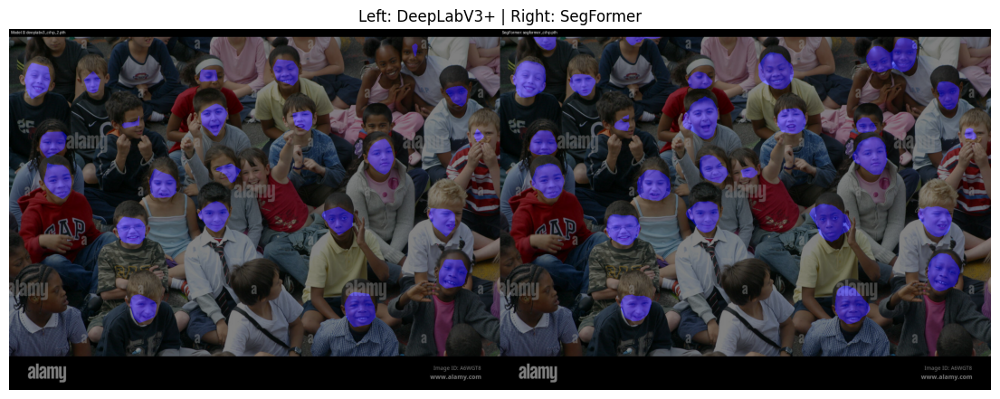

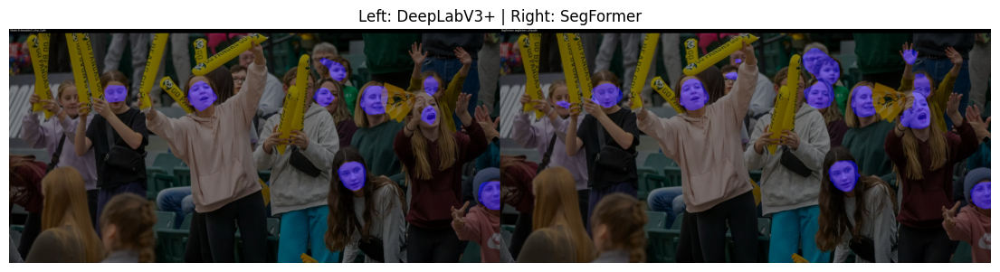

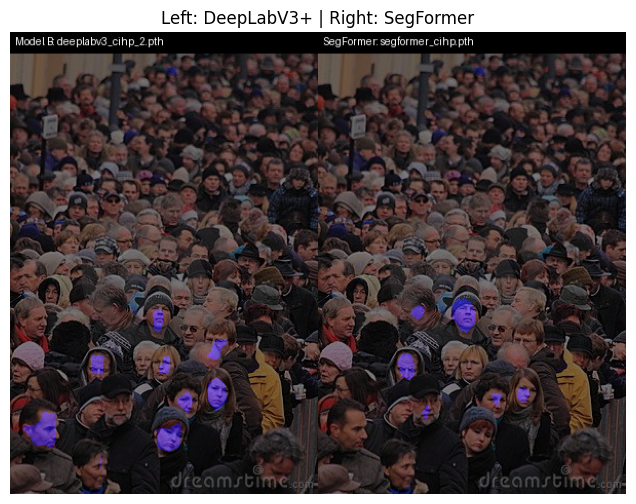

In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, IMG_SIZE, np.array(image_resized)  # return resized image for overlay


# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Load SegFormer ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)

# --- Predict with SegFormer ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (width, height)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits  # shape: [1, C, H, W]
    
    # Resize prediction back to original resolution
    upsampled_logits = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred_mask

def preprocess_resized_image(img_path):
    image = Image.open(img_path).convert("RGB")
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    return image_resized, np.array(image_resized)



# --- Combined display ---
def show_both_models_output(img_path):
    # Original image + preprocessed version
    tensor, original_size, orig_image = preprocess_image(img_path)
    image_pil, orig_image = preprocess_resized_image(img_path)


    # --- Model B (DeepLabV3+) ---
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    # --- SegFormer ---
    mask_S = predict_mask_segformer(segformer, processor, image_pil)
    overlay_S = overlay_mask(orig_image, mask_S)
    overlay_S = draw_caption(overlay_S, "SegFormer: segformer_cihp.pth")

    # --- Combine and show ---
    combined = np.hstack((overlay_B, overlay_S))
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: DeepLabV3+ | Right: SegFormer")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_both_models_output(path)


C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\alexi\AppData\Local\Temp\ipykernel_11844\2616606647.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary 

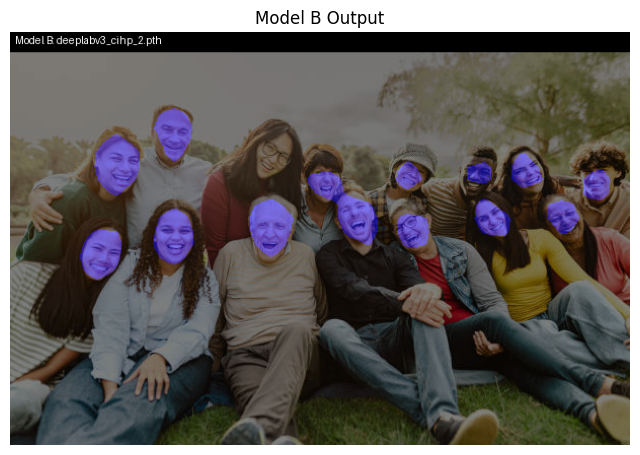

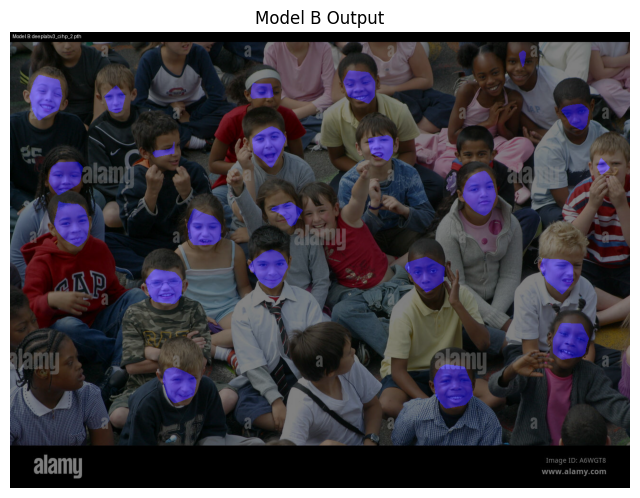

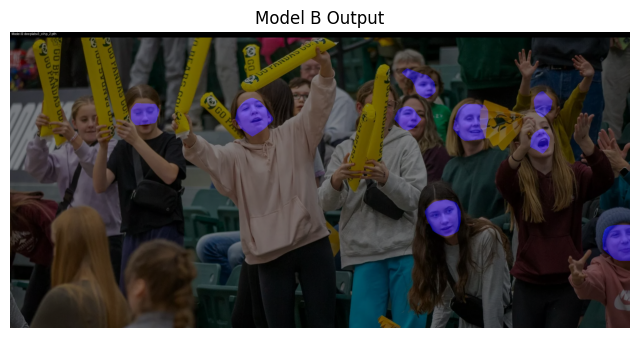

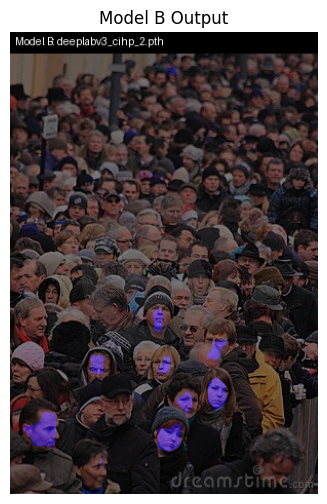

In [ ]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import torchvision.transforms as T
import matplotlib.pyplot as plt

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    original_size = image.size
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, original_size, np.array(image)

# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Show result ---
def show_model_B_output(img_path):
    tensor, original_size, orig_image = preprocess_image(img_path)
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    plt.figure(figsize=(8, 6))
    plt.imshow(overlay_B)
    plt.axis('off')
    plt.title("Model B Output")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_model_B_output(path)


C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\alexi\AppData\Local\Temp\ipykernel_11844\426619007.py:60: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary c

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


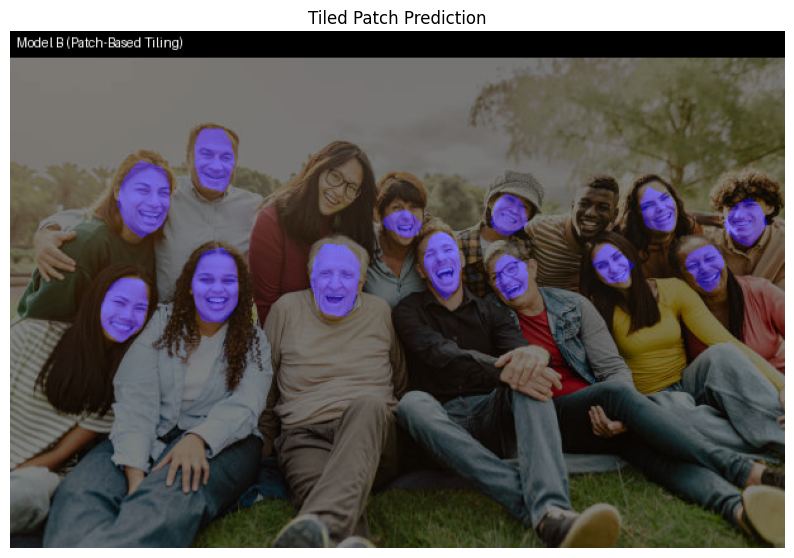

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


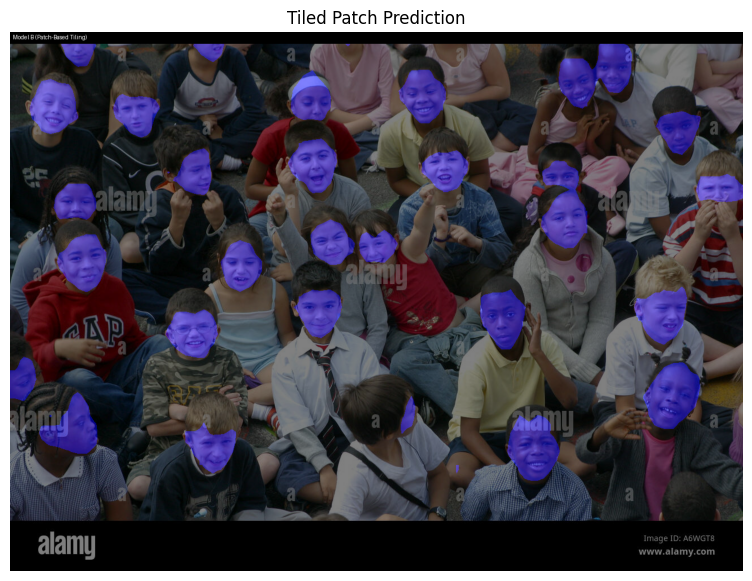

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


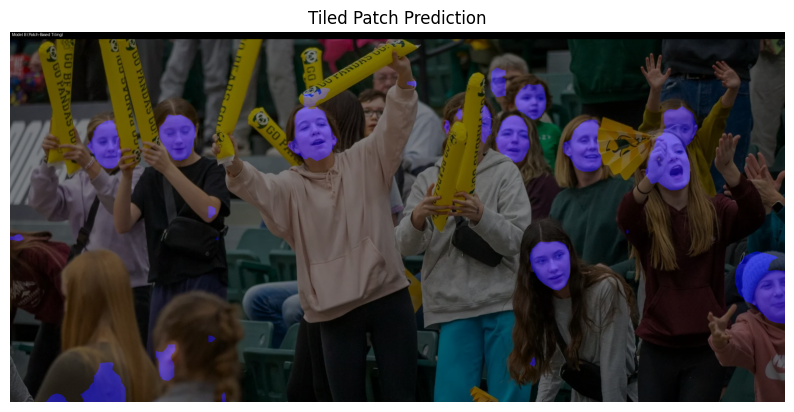

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


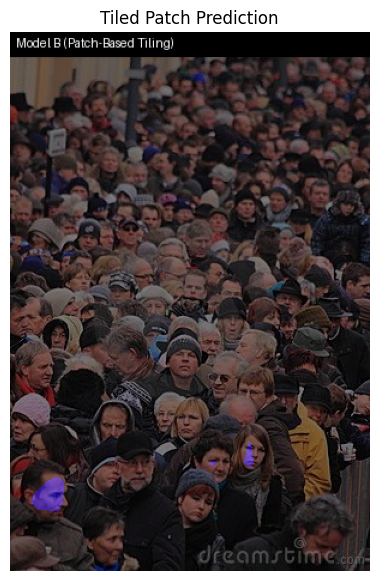

In [17]:
def patchwise_predict(model, image_np, tile_size=512, stride=256, face_class=1):
    h, w, _ = image_np.shape
    full_mask = np.zeros((h, w), dtype=np.uint8)

    transform = T.Compose([
        T.Resize((tile_size, tile_size)),
        T.ToTensor()
    ])

    for y in range(0, h, stride):
        for x in range(0, w, stride):
            # Extract tile
            x_end = min(x + tile_size, w)
            y_end = min(y + tile_size, h)
            tile = image_np[y:y_end, x:x_end]
            
            # Pad if necessary
            pad_right = tile_size - (x_end - x)
            pad_bottom = tile_size - (y_end - y)
            tile_padded = cv2.copyMakeBorder(tile, 0, pad_bottom, 0, pad_right, cv2.BORDER_REFLECT)

            # Predict
            image_tensor = transform(Image.fromarray(tile_padded)).unsqueeze(0).to(DEVICE)
            with torch.no_grad():
                out = model(image_tensor)['out']
                logits = F.interpolate(out, size=(tile_size, tile_size), mode='bilinear', align_corners=False)
                pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()

            # Crop padding and place prediction
            pred_mask = pred_mask[:y_end - y, :x_end - x]
            full_mask[y:y_end, x:x_end] = np.maximum(full_mask[y:y_end, x:x_end], (pred_mask == face_class).astype(np.uint8))

    return full_mask

def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    original_size = image.size
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, original_size, np.array(image)

def show_tiled_prediction(image_path):
    image = Image.open(image_path).convert('RGB')
    image_np = np.array(image)
    mask = patchwise_predict(model_B, image_np, tile_size=512, stride=256, face_class=1)

    # Overlay
    overlay = overlay_mask(image_np, mask, face_class=1, color=(0, 0, 255))
    overlay = draw_caption(overlay, "Model B (Patch-Based Tiling)")

    plt.figure(figsize=(10, 7))
    plt.imshow(overlay)
    plt.axis('off')
    plt.title("Tiled Patch Prediction")
    plt.show()

def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    image = preprocess_image(path)[2]
    result = patchwise_predict(model=model_B, image_np=image)
    print(result)
    show_tiled_prediction(path)




In [13]:
image, _ = dataset[1]  # Already resized & tensorized
input_tensor = image.unsqueeze(0).to(DEVICE)  # Add batch dim
original_size = (image.shape[2], image.shape[1])  # (W, H) from tensor shape

mask = predict_mask(model, input_tensor, original_size)
num_faces = count_faces(mask)

print(f"Detected {num_faces} face(s).")


Detected 4 face(s).
